In [ ]:
pip install dataprep

In [ ]:
pip install plotly

In [ ]:
pip install Dash

In [ ]:
import dash
import pandas as pd
import numpy as np
import seaborn as sns
import dataprep
import matplotlib.pyplot as plt
from dataprep.eda import plot_correlation
from dataprep.datasets import load_dataset
from dataprep.eda import plot
from dataprep.eda import plot_diff
from dataprep.eda.missing import plot_missing

In [ ]:
demo = pd.read_csv('DEMO_PHQ.csv')
pag_hei = pd.read_csv('PAG_HEI.csv')

In [ ]:
demo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5334 entries, 0 to 5333
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEQN      5334 non-null   int64  
 1   DPQ010    4836 non-null   float64
 2   DPQ020    4836 non-null   float64
 3   DPQ030    4836 non-null   float64
 4   DPQ040    4836 non-null   float64
 5   DPQ050    4836 non-null   float64
 6   DPQ060    4836 non-null   float64
 7   DPQ070    4836 non-null   float64
 8   DPQ080    4836 non-null   float64
 9   DPQ090    4836 non-null   float64
 10  RIAGENDR  5334 non-null   int64  
 11  RIDAGEYR  5334 non-null   int64  
 12  RIDRETH1  5334 non-null   int64  
 13  DMDEDUC   5334 non-null   int64  
 14  INDFMINC  5287 non-null   float64
dtypes: float64(10), int64(5)
memory usage: 625.2 KB


In [ ]:
demo.head(10)

,SEQN,DPQ010,DPQ020,DPQ030,DPQ040,DPQ050,DPQ060,DPQ070,DPQ080,DPQ090,RIAGENDR,RIDAGEYR,RIDRETH1,DMDEDUC,INDFMINC
0,31130,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,85,3,4,4.0
1,31131,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,44,4,4,11.0
2,31132,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,70,3,5,11.0
3,31134,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,73,3,3,12.0
4,31139,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,2,18,2,3,11.0
5,31143,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1,19,3,4,11.0
6,31144,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,21,2,3,3.0
7,31149,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,85,3,2,1.0
8,31150,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,79,3,3,3.0
9,31151,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,2,59,4,3,7.0


In [ ]:
pag_hei.info() #9424 observações de crianças e adultos.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9424 entries, 0 to 9423
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SEQN                      9424 non-null   int64  
 1   PAG_MINW                  7150 non-null   float64
 2   ADHERENCE                 7150 non-null   float64
 3   HEI2015C1_TOTALVEG        8549 non-null   float64
 4   HEI2015C2_GREEN_AND_BEAN  8549 non-null   float64
 5   HEI2015C3_TOTALFRUIT      8549 non-null   float64
 6   HEI2015C4_WHOLEFRUIT      8549 non-null   float64
 7   HEI2015C5_WHOLEGRAIN      8549 non-null   float64
 8   HEI2015C6_TOTALDAIRY      8549 non-null   float64
 9   HEI2015C7_TOTPROT         8549 non-null   float64
 10  HEI2015C8_SEAPLANT_PROT   8549 non-null   float64
 11  HEI2015C9_FATTYACID       8549 non-null   float64
 12  HEI2015C10_SODIUM         8549 non-null   float64
 13  HEI2015C11_REFINEDGRAIN   8549 non-null   float64
 14  HEI2015C

In [ ]:
pag_hei.head(10)

,SEQN,PAG_MINW,ADHERENCE,HEI2015C1_TOTALVEG,HEI2015C2_GREEN_AND_BEAN,HEI2015C3_TOTALFRUIT,HEI2015C4_WHOLEFRUIT,HEI2015C5_WHOLEGRAIN,HEI2015C6_TOTALDAIRY,HEI2015C7_TOTPROT,HEI2015C8_SEAPLANT_PROT,HEI2015C9_FATTYACID,HEI2015C10_SODIUM,HEI2015C11_REFINEDGRAIN,HEI2015C12_SFAT,HEI2015C13_ADDSUG,HEI2015_TOTAL_SCORE
0,31128,NaN,NaN,3.083350,0.000000,3.927008,5.000000,0.000000,5.000000,4.251329,0.000000,2.487572,6.911882,10.000000,0.818029,6.408092,47.887262
1,31129,285.450346,2.0,1.697761,0.000000,3.731602,4.929186,0.527631,3.887809,4.693141,0.928562,3.740758,6.146441,7.274979,8.006457,0.000000,45.564326
2,31130,0.000000,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,31131,264.711316,2.0,3.115103,0.000000,5.000000,1.320674,0.000000,3.141062,4.071959,2.052399,0.684985,2.297100,9.512964,0.438428,3.919226,35.553899
4,31132,1353.348730,3.0,3.509081,0.000000,5.000000,5.000000,5.000000,4.448512,5.000000,0.000000,2.050769,7.369489,8.887880,8.186877,9.099088,63.551696
5,31133,0.000000,1.0,1.417400,0.000000,2.083333,1.317204,0.000000,3.176179,3.617204,0.470430,5.657701,5.589008,0.000000,6.473871,5.779322,35.581653
6,31134,1011.478060,3.0,2.845772,1.283933,2.629005,5.000000,2.217331,2.313900,5.000000,1.268648,2.958985,0.000000,5.627488,5.863078,5.878686,42.886826
7,31136,713.625866,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,31137,1423.787529,3.0,1.516093,0.000000,0.828672,0.000000,0.676749,5.000000,3.526000,0.000000,4.379950,8.192344,7.032194,5.461700,0.000000,36.613702
9,31138,NaN,NaN,3.389396,0.000000,5.000000,5.000000,1.558511,5.000000,4.079000,0.000000,7.149274,2.288504,5.801370,7.816354,7.899627,54.982037


/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

Computing series-max-agg-36fadb8e3b3fd6bfbfd5f118f0bebfb2:   0%|          | 0/110 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.




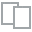
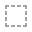
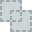
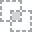
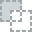
...
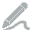
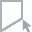
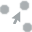
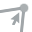
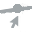

In [ ]:
plot(pag_hei, "PAG_MINW")

In [ ]:
jt = demo.merge(pag_hei, how = 'left',  on = 'SEQN')
jt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5334 entries, 0 to 5333
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SEQN                      5334 non-null   int64  
 1   DPQ010                    4836 non-null   float64
 2   DPQ020                    4836 non-null   float64
 3   DPQ030                    4836 non-null   float64
 4   DPQ040                    4836 non-null   float64
 5   DPQ050                    4836 non-null   float64
 6   DPQ060                    4836 non-null   float64
 7   DPQ070                    4836 non-null   float64
 8   DPQ080                    4836 non-null   float64
 9   DPQ090                    4836 non-null   float64
 10  RIAGENDR                  5334 non-null   int64  
 11  RIDAGEYR                  5334 non-null   int64  
 12  RIDRETH1                  5334 non-null   int64  
 13  DMDEDUC                   5334 non-null   int64  
 14  INDFMINC

###VISUALIZANDO DADOS FALTANTES:

In [ ]:
# Primeira forma de ver os dados faltantes
jt.isnull().sum()

SEQN                          0
DPQ010                      498
DPQ020                      498
DPQ030                      498
DPQ040                      498
DPQ050                      498
DPQ060                      498
DPQ070                      498
DPQ080                      498
DPQ090                      498
RIAGENDR                      0
RIDAGEYR                      0
RIDRETH1                      0
DMDEDUC                       0
INDFMINC                     47
PAG_MINW                      0
ADHERENCE                     0
HEI2015C1_TOTALVEG          274
HEI2015C2_GREEN_AND_BEAN    274
HEI2015C3_TOTALFRUIT        274
HEI2015C4_WHOLEFRUIT        274
HEI2015C5_WHOLEGRAIN        274
HEI2015C6_TOTALDAIRY        274
HEI2015C7_TOTPROT           274
HEI2015C8_SEAPLANT_PROT     274
HEI2015C9_FATTYACID         274
HEI2015C10_SODIUM           274
HEI2015C11_REFINEDGRAIN     274
HEI2015C12_SFAT             274
HEI2015C13_ADDSUG           274
HEI2015_TOTAL_SCORE         274
dtype: i

In [ ]:
# Segunda forma de ver os dados faltantes
jt.isnull().mean().round(4)*100

SEQN                        0.00
DPQ010                      9.34
DPQ020                      9.34
DPQ030                      9.34
DPQ040                      9.34
DPQ050                      9.34
DPQ060                      9.34
DPQ070                      9.34
DPQ080                      9.34
DPQ090                      9.34
RIAGENDR                    0.00
RIDAGEYR                    0.00
RIDRETH1                    0.00
DMDEDUC                     0.00
INDFMINC                    0.88
PAG_MINW                    0.00
ADHERENCE                   0.00
HEI2015C1_TOTALVEG          5.14
HEI2015C2_GREEN_AND_BEAN    5.14
HEI2015C3_TOTALFRUIT        5.14
HEI2015C4_WHOLEFRUIT        5.14
HEI2015C5_WHOLEGRAIN        5.14
HEI2015C6_TOTALDAIRY        5.14
HEI2015C7_TOTPROT           5.14
HEI2015C8_SEAPLANT_PROT     5.14
HEI2015C9_FATTYACID         5.14
HEI2015C10_SODIUM           5.14
HEI2015C11_REFINEDGRAIN     5.14
HEI2015C12_SFAT             5.14
HEI2015C13_ADDSUG           5.14
HEI2015_TO

In [ ]:
jt.drop(columns=['SEQN']).describe(percentiles =[.25, .5, .75, .95, .99]).round(2)

,DPQ010,DPQ020,DPQ030,DPQ040,DPQ050,DPQ060,DPQ070,DPQ080,DPQ090,RIAGENDR,RIDAGEYR,RIDRETH1,DMDEDUC,INDFMINC,PAG_MINW,ADHERENCE,HEI2015C1_TOTALVEG,HEI2015C2_GREEN_AND_BEAN,HEI2015C3_TOTALFRUIT,HEI2015C4_WHOLEFRUIT,HEI2015C5_WHOLEGRAIN,HEI2015C6_TOTALDAIRY,HEI2015C7_TOTPROT,HEI2015C8_SEAPLANT_PROT,HEI2015C9_FATTYACID,HEI2015C10_SODIUM,HEI2015C11_REFINEDGRAIN,HEI2015C12_SFAT,HEI2015C13_ADDSUG,HEI2015_TOTAL_SCORE
count,4836.00,4836.00,4836.00,4836.00,4836.00,4836.00,4836.00,4836.00,4836.00,5334.00,5334.00,5334.00,5334.00,5287.00,5334.00,5334.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00
mean,0.31,0.31,0.55,0.72,0.32,0.21,0.23,0.15,0.05,1.52,45.09,2.87,3.23,8.74,471.77,1.98,3.20,1.81,2.49,2.36,1.76,3.76,4.43,2.59,4.71,4.76,5.80,6.07,6.22,49.97
std,0.76,0.71,0.93,0.91,0.74,0.62,0.64,0.59,0.33,0.50,20.15,1.13,1.27,12.78,780.35,0.92,1.47,2.14,1.95,2.17,1.92,1.61,1.01,2.17,3.24,3.42,3.50,3.18,3.33,12.32
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,18.00,1.00,1.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,16.06
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,27.00,3.00,2.00,4.00,35.00,1.00,2.06,0.00,0.45,0.00,0.00,2.59,4.17,0.00,2.02,1.59,2.93,3.70,3.72,41.03
50%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,43.00,3.00,3.00,7.00,210.00,2.00,3.22,0.06,2.32,2.08,1.03,4.94,5.00,2.59,4.43,4.83,6.23,6.41,6.86,49.51
75%,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,2.00,62.00,4.00,4.00,10.00,568.93,3.00,4.83,4.50,4.94,5.00,3.41,5.00,5.00,5.00,7.27,7.65,9.25,9.00,9.45,58.17
95%,2.00,2.00,3.00,3.00,2.00,1.00,1.00,1.00,0.00,2.00,81.00,4.00,5.00,11.00,1863.05,3.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,10.00,10.00,10.00,10.00,10.00,71.19
99%,3.00,3.00,3.00,3.00,3.00,3.00,3.00,3.00,1.00,2.00,85.00,5.00,5.00,99.00,3672.06,3.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,10.00,10.00,10.00,10.00,10.00,79.86
max,9.00,9.00,9.00,9.00,9.00,9.00,9.00,9.00,9.00,2.00,85.00,5.00,9.00,99.00,10777.83,3.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,10.00,10.00,10.00,10.00,10.00,89.53



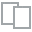
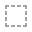
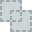
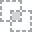
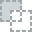
...
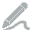
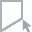
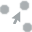
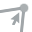
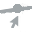

In [ ]:
plot_correlation(jt)

# Por curiosidade, irei visualizar a correlação do novo "df" com a ferramenta "DataPrep"
# Vemos aqui, que tem uma correção legal entre as variaveis ""DPQ010" a ""DPQ090", abrindo sentido para análisar essas variáveis depois.


In [ ]:
jt[[
"DPQ010",
"DPQ020",
"DPQ030",
"DPQ040",
"DPQ050",
"DPQ060",
"DPQ070",
"DPQ080",
"DPQ090"]].agg(['value_counts'])

,DPQ010,DPQ020,DPQ030,DPQ040,DPQ050,DPQ060,DPQ070,DPQ080,DPQ090
,value_counts,value_counts,value_counts,value_counts,value_counts,value_counts,value_counts,value_counts,value_counts
0.0,3850,3769,3152,2429,3813,4134,4070,4362,4667
1.0,673,769,1071,1706,691,513,545,341,122
2.0,180,179,286,370,160,95,118,79,32
3.0,124,114,320,326,168,89,99,45,13
9.0,9,5,7,5,4,5,4,9,2


###A PARTI DE AGORA, COMEÇA UMA VISUALIZAÇÃO DE VARIÁVEIS. - PARTE 1.

nota: Estuda essa por## Jonas!

Visualizando detalhes das Variaveis "RIDRETH1", "RIAGENDR", "RIDAGEYR", "INDFMINC", "DMDEDUC", "ADHERENCE".



In [ ]:
jt[["RIAGENDR"]].value_counts(sort = False)

# Tem um numero maior de pessoas no publico feminino, entorno de 2773.

RIAGENDR
1           2561
2           2773
dtype: int64

In [ ]:
jt[["RIDAGEYR"]].value_counts(sort = False)

RIDAGEYR
18          301
19          260
20           95
21           99
22          105
           ... 
81           55
82           41
83           39
84           33
85          148
Length: 68, dtype: int64

/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

Computing series-max-agg-5bac35e8bb15c00bcd5c670816c30737:   0%|          | 0/110 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.




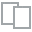
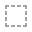
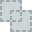
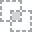
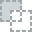
...
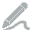
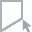
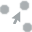
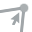
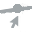

In [ ]:
plot(jt, "RIDAGEYR")

# Vemos aqui a distribuição das idades.
# A media de idade é entorno de 43 a 45 anos.

In [ ]:
jt[["INDFMINC"]].value_counts(sort = False)

# 'Renda maior ou igual a 75.000' tem a maior concentração de pessoas.

INDFMINC
1.0          190
2.0          281
3.0          440
4.0          412
5.0          426
6.0          678
7.0          535
8.0          485
9.0          297
10.0         278
11.0        1044
12.0          78
13.0          30
77.0          36
99.0          77
dtype: int64

In [ ]:
jt[["DMDEDUC"]].value_counts(sort = False)

# o primeiro grupo com mais pessoas é o "4", onde é esperado que essas pessoas estejam no "Esino Superior"
# O segundo grupo com mais pessoas é o "3", que seria os jovens no "Ensino Médio#
# Mas iremos desconsidera do 1 ao 3 (por enquanto) por conta dessa atividade ter o foco apénas no publico alvo#

DMDEDUC
1           618
2           936
3          1335
4          1498
5           939
7             4
9             4
dtype: int64

In [ ]:
jt[["RIDRETH1"]].value_counts(sort = False)

# O maior numero de pessoas é "Mexicano-Americano" no grupo "3".
# O Segundo maior grupo de pessoas é "Outros" no grupo "4".
# Terceiro maior grupo de pessoas são "Brancas" no grupo "1".
# Os negros são o menor grupo dessa Variavel.

RIDRETH1
1           1133
2            164
3           2516
4           1300
5            221
dtype: int64

###Agrupando e recategorizando variáveis qualitativas:

Nota: Estudar mais sobre como fazer.

Nota2: Eu estudei e vou aderir essa forma, achei NICE!!

Eu estudei uma forma de retirar as informações "1", "2" e "3" da Variavel "DMDEDUC", porém os metodos ".drop", ".shape" e entre outros não seria muito viavel nesse caso, então a função "replace_map" é a mais indicada e recomendada. Irei estudar e entender mais sobre tal função.




In [ ]:
replace_map = {
  "DPQ010": {7: np.nan, 9: np.nan},
  "DPQ020": {7: np.nan, 9: np.nan},
  "DPQ030": {7: np.nan, 9: np.nan},
  "DPQ040": {7: np.nan, 9: np.nan},
  "DPQ050": {7: np.nan, 9: np.nan},
  "DPQ060": {7: np.nan, 9: np.nan},
  "DPQ070": {7: np.nan, 9: np.nan},
  "DPQ080": {7: np.nan, 9: np.nan},
  "DPQ090": {7: np.nan, 9: np.nan},
  "RIDRETH1": {5: 2},
  "DMDEDUC": {7: np.nan, 9: np.nan},
  "INDFMINC": {1: np.mean([0,4999]), 2: np.mean([5000,9999]), 3: np.mean([10000,14999]),4: np.mean([15000,19999]),
               5: np.mean([20000,24999]),6: np.mean([25000,34999]), 7: np.mean([35000,44999]), 8: np.mean([45000,54999]),
               9: np.mean([55000,64999]), 10: np.mean([65000,74999]), 11: np.mean([75000,95000]), 12: np.mean([20000, 90000]), 13: np.mean([0, 19999]),
               77: np.nan, 99: np.nan}
}

njt = jt.replace(replace_map)

/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

Computing series-max-agg-1ef12e64b9010390b902f985bcb04261:   0%|          | 0/110 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.




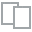
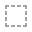
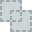
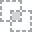
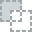
...
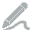
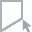
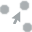
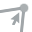
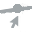

In [ ]:
plot(njt, "INDFMINC")

# O plot mostra os valores 'mean' de cada resposta para a pergunta feita na variável "INDFMINC". 

In [ ]:
njt[["INDFMINC"]].value_counts(sort = False)

INDFMINC
2499.5       190
7499.5       281
9999.5        30
12499.5      440
17499.5      412
22499.5      426
29999.5      678
39999.5      535
49999.5      485
55000.0       78
59999.5      297
69999.5      278
85000.0     1044
dtype: int64

In [ ]:
njt[["RIDAGEYR"]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5334 entries, 0 to 5333
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   RIDAGEYR  5334 non-null   int64
dtypes: int64(1)
memory usage: 83.3 KB


In [ ]:
njt[["DMDEDUC"]].isnull().mean().round(4)

DMDEDUC    0.0015
dtype: float64


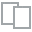
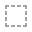
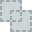
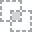
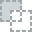
...
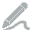
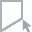
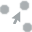
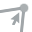
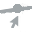

In [ ]:
# Vemos aqui que o valor "3" é o segundo maior em "Frequency", esse valor foi colocado com 'np.nan'.

plot(njt, "DMDEDUC")


# Criação das Variáveis.

In [ ]:
# Checando os valores nulos do novo DataBase    
njt.isnull().mean().round(4)*100

SEQN                        0.00
DPQ010                      9.51
DPQ020                      9.43
DPQ030                      9.47
DPQ040                      9.43
DPQ050                      9.41
DPQ060                      9.43
DPQ070                      9.41
DPQ080                      9.51
DPQ090                      9.37
RIAGENDR                    0.00
RIDAGEYR                    0.00
RIDRETH1                    0.00
DMDEDUC                     0.15
INDFMINC                    3.00
PAG_MINW                    0.00
ADHERENCE                   0.00
HEI2015C1_TOTALVEG          5.14
HEI2015C2_GREEN_AND_BEAN    5.14
HEI2015C3_TOTALFRUIT        5.14
HEI2015C4_WHOLEFRUIT        5.14
HEI2015C5_WHOLEGRAIN        5.14
HEI2015C6_TOTALDAIRY        5.14
HEI2015C7_TOTPROT           5.14
HEI2015C8_SEAPLANT_PROT     5.14
HEI2015C9_FATTYACID         5.14
HEI2015C10_SODIUM           5.14
HEI2015C11_REFINEDGRAIN     5.14
HEI2015C12_SFAT             5.14
HEI2015C13_ADDSUG           5.14
HEI2015_TO

.

In [ ]:
njt[["DPQ010", "DPQ020", "DPQ030", "DPQ040", "DPQ050", "DPQ060", "DPQ070", "DPQ080", "DPQ090"]].isnull().mean()*100

DPQ010    9.505062
DPQ020    9.430071
DPQ030    9.467567
DPQ040    9.430071
DPQ050    9.411324
DPQ060    9.430071
DPQ070    9.411324
DPQ080    9.505062
DPQ090    9.373828
dtype: float64

In [ ]:
njt["phq9"] = njt[["DPQ010", 
                   "DPQ020", 
                   "DPQ030", 
                   "DPQ040", 
                   "DPQ050", 
                   "DPQ060", 
                   "DPQ070", 
                   "DPQ080", 
                   "DPQ090"]].sum(axis = 'columns', skipna = False)

njt[["DPQ010", 
     "DPQ020", 
     "DPQ030", 
     "DPQ040",
     "DPQ050", 
     "DPQ060", 
     "DPQ070", 
     "DPQ080", 
     "DPQ090",
     "phq9"]].head(10)

,DPQ010,DPQ020,DPQ030,DPQ040,DPQ050,DPQ060,DPQ070,DPQ080,DPQ090,phq9
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,4.0
5,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,6.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,3.0


In [ ]:
# Olhando como ficou todo o banco de dados do novo database.

njt.head()

,SEQN,DPQ010,DPQ020,DPQ030,DPQ040,DPQ050,DPQ060,DPQ070,DPQ080,DPQ090,RIAGENDR,RIDAGEYR,RIDRETH1,DMDEDUC,INDFMINC,PAG_MINW,ADHERENCE,HEI2015C1_TOTALVEG,HEI2015C2_GREEN_AND_BEAN,HEI2015C3_TOTALFRUIT,HEI2015C4_WHOLEFRUIT,HEI2015C5_WHOLEGRAIN,HEI2015C6_TOTALDAIRY,HEI2015C7_TOTPROT,HEI2015C8_SEAPLANT_PROT,HEI2015C9_FATTYACID,HEI2015C10_SODIUM,HEI2015C11_REFINEDGRAIN,HEI2015C12_SFAT,HEI2015C13_ADDSUG,HEI2015_TOTAL_SCORE,phq9
0,31130,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,85,3,4.0,17499.5,0.000000,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,31131,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,44,4,4.0,85000.0,264.711316,2.0,3.115103,0.000000,5.000000,1.320674,0.000000,3.141062,4.071959,2.052399,0.684985,2.297100,9.512964,0.438428,3.919226,35.553899,0.0
2,31132,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,70,3,5.0,85000.0,1353.348730,3.0,3.509081,0.000000,5.000000,5.000000,5.000000,4.448512,5.000000,0.000000,2.050769,7.369489,8.887880,8.186877,9.099088,63.551696,0.0
3,31134,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,73,3,3.0,55000.0,1011.478060,3.0,2.845772,1.283933,2.629005,5.000000,2.217331,2.313900,5.000000,1.268648,2.958985,0.000000,5.627488,5.863078,5.878686,42.886826,0.0
4,31139,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,2,18,2,3.0,85000.0,1729.145497,3.0,5.000000,0.000000,0.991614,0.056664,0.211544,0.000000,4.088849,4.221442,10.000000,2.845774,0.000000,10.000000,9.658507,47.074393,4.0


Agora, criar a varivel de grupo PHQ_GRP

------------------------------------------------------------------------------

Criando a variável phq_grp - grupo de sintomas de depressão que assume 0 (“sem sintomas”) se phq9 < 5, 1 (“sintomas leves”) se 5 <= phq9 < 10, 2 (“sintomas moderados”) se 10 <= phq9 < 15, 3 (“sintomas moderadamente severos”) se 15 <= phq9 < 19 e 4 (“sintomas severos”) se phq9 >= 20

In [ ]:
conditions = [
  (njt['phq9'].isna()),
  (njt['phq9'] < 5),
  (njt['phq9'] <= 5) & (njt['phq9'] < 10),
  (njt['phq9'] <= 10) & (njt['phq9'] < 15),
  (njt['phq9'] <= 15) & (njt['phq9'] < 19),
  (njt['phq9'] >= 19)
    ]
values = [np.nan, 0, 1, 2, 3, 4]

njt["phq_grp"] = np.select(conditions, values)

njt[["phq_grp"]].value_counts(sort = False)


phq_grp
0.0        3836
1.0         217
2.0         547
3.0         165
4.0          34
dtype: int64


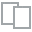
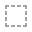
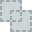
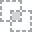
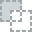
...
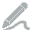
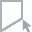
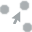
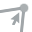
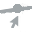

In [ ]:
plot(njt, "phq_grp")

In [ ]:
njt[["phq_grp"]].isnull().mean().round(4)*100

phq_grp    10.03
dtype: float64

In [ ]:
njt[["phq_grp"]].value_counts(sort = False)

phq_grp
0.0        3836
1.0         217
2.0         547
3.0         165
4.0          34
dtype: int64


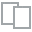
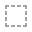
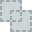
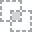
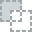
...
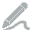
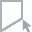
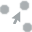
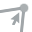
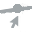

In [ ]:
plot(njt, "phq_grp")

### ANÁLISE UNIVARIADA 

será usado a variável "phq_grp".

In [ ]:

var_quant = [
    "RIDAGEYR", 
    "INDFMINC", 
    "PAG_MINW", 
    "HEI2015C1_TOTALVEG",
    "HEI2015C2_GREEN_AND_BEAN",
    "HEI2015C3_TOTALFRUIT",
    "HEI2015C4_WHOLEFRUIT",
    "HEI2015C5_WHOLEGRAIN",
    "HEI2015C6_TOTALDAIRY",
    "HEI2015C7_TOTPROT",
    "HEI2015C8_SEAPLANT_PROT",
    "HEI2015C9_FATTYACID",
    "HEI2015C10_SODIUM",
    "HEI2015C11_REFINEDGRAIN",
    "HEI2015C12_SFAT",
    "HEI2015C13_ADDSUG",
    "HEI2015_TOTAL_SCORE",
    "phq9"]

var_quali = [
    "RIAGENDR",
    "RIDRETH1",
    "DMDEDUC",
    "ADHERENCE",
    "phq_grp"
]

label_quali = {
  "RIAGENDR": {1: 'Masculino', 2: 'Feminino'},
  "RIDRETH1": {1: 'Americano Mexicano', 2: 'Outro', 3: 'Branco \n não hispânico', 4: 'Negro \n não hispânico'},
  "DMDEDUC": {1: "< 9 ano", 2: "9-12 ano", 3: "Ensino \n médio", 4: "Superior \n incompleto", 5: "Superior \n completo"},
  "ADHERENCE": {1: 'Baixo', 2: 'Adequado', 3: 'Acima'},
  "phq_grp": {0: "S/ Sint.", 1: "Sint. Leves", 2: "Sint. Mderados", 3: "Sint. MS" , 4: "Sint. Severos" }
}

In [ ]:
njt[var_quant].describe(percentiles = [.25, .5, .75, .95, .99]).round(2)

,RIDAGEYR,INDFMINC,PAG_MINW,HEI2015C1_TOTALVEG,HEI2015C2_GREEN_AND_BEAN,HEI2015C3_TOTALFRUIT,HEI2015C4_WHOLEFRUIT,HEI2015C5_WHOLEGRAIN,HEI2015C6_TOTALDAIRY,HEI2015C7_TOTPROT,HEI2015C8_SEAPLANT_PROT,HEI2015C9_FATTYACID,HEI2015C10_SODIUM,HEI2015C11_REFINEDGRAIN,HEI2015C12_SFAT,HEI2015C13_ADDSUG,HEI2015_TOTAL_SCORE,phq9
count,5334.00,5174.00,5334.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,5060.00,4799.00
mean,45.09,42805.46,471.77,3.20,1.81,2.49,2.36,1.76,3.76,4.43,2.59,4.71,4.76,5.80,6.07,6.22,49.97,2.73
std,20.15,27242.08,780.35,1.47,2.14,1.95,2.17,1.92,1.61,1.01,2.17,3.24,3.42,3.50,3.18,3.33,12.32,3.73
min,18.00,2499.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,16.06,0.00
25%,27.00,17499.50,35.00,2.06,0.00,0.45,0.00,0.00,2.59,4.17,0.00,2.02,1.59,2.93,3.70,3.72,41.03,0.00
50%,43.00,39999.50,210.00,3.22,0.06,2.32,2.08,1.03,4.94,5.00,2.59,4.43,4.83,6.23,6.41,6.86,49.51,1.00
75%,62.00,69999.50,568.93,4.83,4.50,4.94,5.00,3.41,5.00,5.00,5.00,7.27,7.65,9.25,9.00,9.45,58.17,4.00
95%,81.00,85000.00,1863.05,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,10.00,10.00,10.00,10.00,10.00,71.19,10.00
99%,85.00,85000.00,3672.06,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,10.00,10.00,10.00,10.00,10.00,79.86,17.00
max,85.00,85000.00,10777.83,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,10.00,10.00,10.00,10.00,10.00,89.53,27.00


Como foi instruido, o valor entre o "99%" e o "max" estão muito distantes, sendo assim um possivel "erro" - Irei fazer uma pesquisa em relação a esse valor e mudarei assim que tiver uma resposta.

Sera colocado atráves de uma função ("np.where") o valor de "3.600" (min) por semana para valores maiores que "3.600":

In [ ]:
njt['PAG_MINW_truco'] = np.where(njt['PAG_MINW'] > 3600, 3600, njt['PAG_MINW'])

In [ ]:
# verificando se os valores estão corretos entre "99%" e "max", entre a variavel original ("PAG_MINW") e a nova variavel ("PAG_MINW_truco").

njt[['PAG_MINW', 'PAG_MINW_truco']].describe(percentiles = [.25, .5, .75, .95, .99]).round(2)

,PAG_MINW,PAG_MINW_truco
count,5334.00,5334.00
mean,471.77,454.86
std,780.35,663.05
min,0.00,0.00
25%,35.00,35.00
50%,210.00,210.00
75%,568.93,568.93
95%,1863.05,1863.05
99%,3672.06,3600.00
max,10777.83,3600.00


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



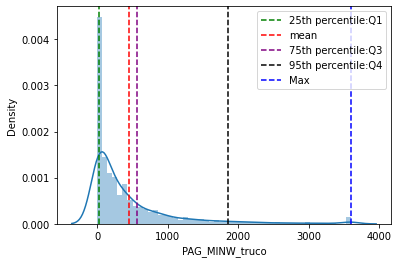

In [ ]:
# Por curiosidade eu irei plota uma grafico mostrando alguns detalhes a mais sobre os "Percentile" da Variável "PAG_MINW_trunco"
# por conta de sua mudança para 3600 minutos (60h semanais)

sns.distplot(njt['PAG_MINW_truco'])
plt.axvline(x=np.percentile(njt['PAG_MINW_truco'],25), c='green', ls='--', label = '25th percentile:Q1')
plt.axvline(x=np.mean(njt['PAG_MINW_truco']), c='red', ls='--', label='mean')
plt.axvline(x=np.percentile(njt['PAG_MINW_truco'],75), c='purple', ls='--',label = '75th percentile:Q3' )
plt.axvline(x=np.percentile(njt['PAG_MINW_truco'],95), c='black', ls='--',label = '95th percentile:Q4' )
plt.axvline(x=np.percentile(njt['PAG_MINW_truco'],100), c='blue', ls='--',label = 'Max' )
plt.legend()


/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

Computing series-max-agg-63c5928a6155d9e7f15015c5234c4414:   0%|          | 0/110 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/dask/utils.py:893: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.




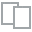
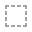
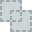
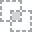
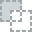
...
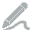
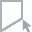
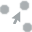
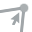
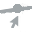

In [ ]:
# Fazendo uma visualização de como está a "variável" "PAG_MINW_trunc".


plot(njt, "PAG_MINW_truco")


--------------------------------------------------------------------------------
Deixando os valores em minutos da variável "PAG_MINW_truco" em horas, porém mantendo a Variavel "PAG_MINW_truco "intacta":

In [ ]:
njt["PAG_HRW"] = njt["PAG_MINW_truco"]/60

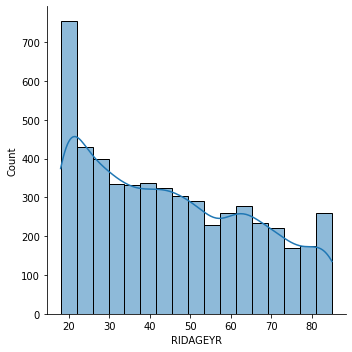

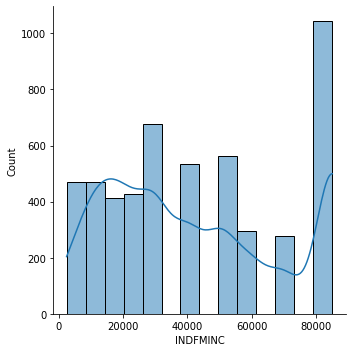

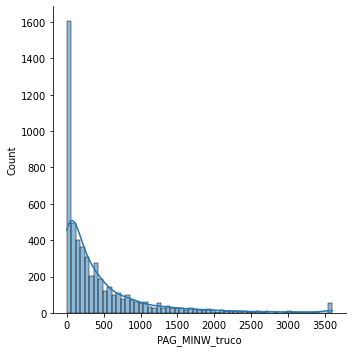

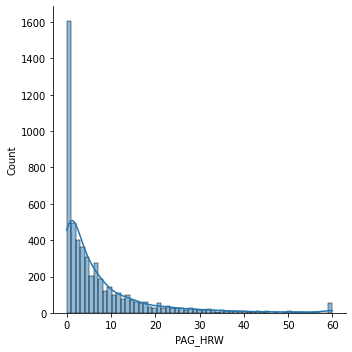

In [ ]:
sns.displot(njt, x="RIDAGEYR", kde=True)
sns.displot(njt, x="INDFMINC", kde=True)
sns.displot(njt, x="PAG_MINW_truco", kde=True)
sns.displot(njt, x="PAG_HRW", kde=True)
plt.show()

:Como a variavel "PAG_HRW" é bastante assimétrica, será feito uma versão com log-normal:

Será feito na de minutos e horas (só para explorar mais a função "np.log")

In [ ]:
# Log-normal ná variável "PAG_HRW".

njt["PAG_HRW_log"] = np.log(njt["PAG_HRW"] + 1)


In [ ]:
# Log-normal ná variável "PAG_MINW"

njt["PAG_MINW_log"] = np.log(njt["PAG_HRW"] + 1)


In [ ]:
# Para uma melhor exploração, foi usado aqui um metodo para ter um grafico hist interativo
# da variável "PAG_HRW_log"

import plotly.figure_factory as ff

x = njt["PAG_HRW_log"]

hist_data = [x]
group_labels = ['PAG_HRW_log'] # name of the dataset
colors = ['slategray']

fig = ff.create_distplot(hist_data, group_labels, bin_size=.18, colors=colors, show_rug=False, curve_type='kde')
fig.show()

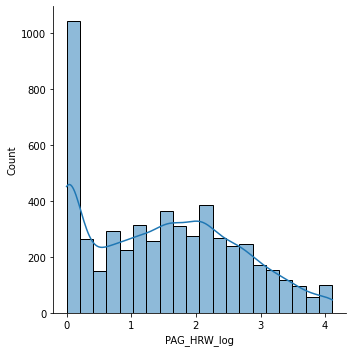

In [ ]:
sns.displot(njt, x="PAG_HRW_log", kde=True)
plt.show()

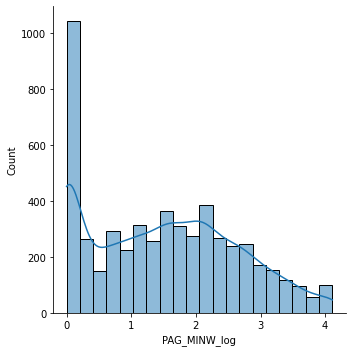

In [ ]:
# Visualizando a variavel "PAG_MINW_log" (minutos em vez de horas) para checar se ter alguma diferença.

sns.displot(njt, x="PAG_MINW_log", kde=True)
plt.show()

Criando uma função para plota graficos de Barra.

In [ ]:
import plotly.graph_objects as go


In [ ]:
def grafico_barras_prop(data, variable):
    (data[[variable]]
     .value_counts(normalize=True, sort = False)
     .rename("Proportion")
     .reset_index()
     .pipe((sns.barplot, "data"), x=variable, y="Proportion"))
    plt.ylim(0,1)
    plt.show()

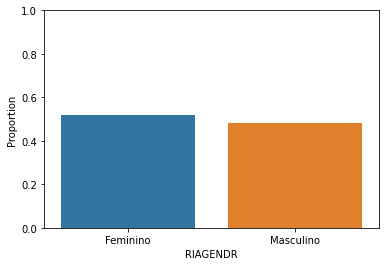

In [ ]:
grafico_barras_prop(njt.replace(label_quali), variable = "RIAGENDR")

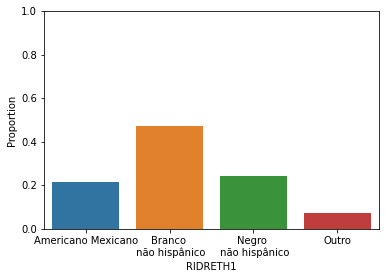

In [ ]:
grafico_barras_prop(njt.replace(label_quali), variable = "RIDRETH1")

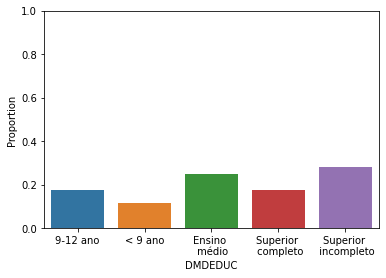

In [ ]:
grafico_barras_prop(njt.replace(label_quali), variable = "DMDEDUC")

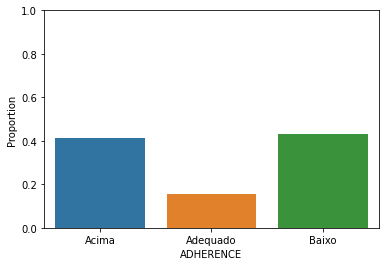

In [ ]:
grafico_barras_prop(njt.replace(label_quali), variable = "ADHERENCE")

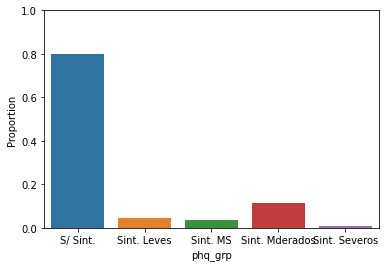

In [ ]:
grafico_barras_prop(njt.replace(label_quali), variable = "phq_grp")

In [ ]:
# Adiciono um grafico de distribuição para ter uma outra visão.
sns.scatterplot(njt[''], njt[''])

##ANÁLISE BIVARIADA

In [ ]:
# Função para criar grafico box plot.
# Deixarei a formula aqui por enquanto.

def grafico_boxplot_grp(data, variable, label):
    
    if label == "": label = variable
    sns.boxplot(x="phq_grp", y=variable, data=data)
    plt.ylabel(label)
    plt.show()

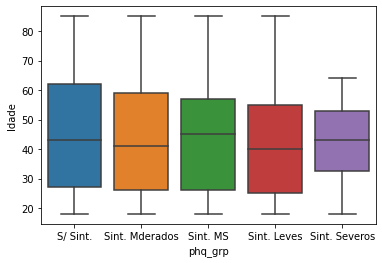

In [ ]:
# Plotando o grafico Box plot de forma simples com 

grafico_boxplot_grp(njt.replace(label_quali), "RIDAGEYR", "Idade")

In [ ]:
# Plotando o grafico Box Plot de uma forma mais elaborada.

import plotly.express as px
db = px.data.tips()
fig = px.box(njt.replace(label_quali), x="phq_grp", y="RIDAGEYR", points="all")
fig.show()


--------------------------------------------------------------------------------
Teste de Hipótese: 

In [ ]:
from scipy.stats import f_oneway

db_aux = njt[["phq_grp", "RIDAGEYR"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.phq_grp == 0)]["RIDAGEYR"],
                   db_aux[(db_aux.phq_grp == 1)]["RIDAGEYR"],
                   db_aux[(db_aux.phq_grp == 2)]["RIDAGEYR"],
                   db_aux[(db_aux.phq_grp == 3)]["RIDAGEYR"],
                   db_aux[(db_aux.phq_grp == 4)]["RIDAGEYR"])

print('stat=%.3f, p=%.3f' % (stat, p)) 

stat=1.860, p=0.115


In [ ]:
db = px.data.tips()
fig = px.box(njt.replace(label_quali), x="phq_grp", y="INDFMINC", points="all")
fig.show()

------------------------------------

In [ ]:
db_aux = njt[["phq_grp", "INDFMINC"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.phq_grp == 0)]["INDFMINC"],
                   db_aux[(db_aux.phq_grp == 1)]["INDFMINC"],
                   db_aux[(db_aux.phq_grp == 2)]["INDFMINC"],
                   db_aux[(db_aux.phq_grp == 3)]["INDFMINC"],
                   db_aux[(db_aux.phq_grp == 4)]["INDFMINC"])

print('stat=%.3f, p=%.3f' % (stat, p)) 

stat=19.919, p=0.000


Análisar pontos a ser considerados: 

In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

tukey = pairwise_tukeyhsd(db_aux['INDFMINC'],
                  db_aux['phq_grp'],
                  alpha = 0.05)
print(tukey)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
group1 group2   meandiff  p-adj     lower      upper    reject
--------------------------------------------------------------
   0.0    1.0  -2263.5166 0.7421  -7548.8734  3021.8402  False
   0.0    2.0  -7149.1047  0.001 -10612.1924  -3686.017   True
   0.0    3.0 -12886.1731  0.001 -18857.9331 -6914.4131   True
   0.0    4.0  -21175.295  0.001  -34148.341  -8202.249   True
   1.0    2.0  -4885.5881 0.1827 -10967.9896  1196.8135  False
   1.0    3.0 -10622.6564 0.0019 -18411.4015 -2833.9114   True
   1.0    4.0 -18911.7784 0.0019 -32815.1073 -5008.4495   True
   2.0    3.0  -5737.0684  0.132 -12424.5589   950.4222  False
   2.0    4.0 -14026.1903 0.0332 -27343.8679  -708.5128   True
   3.0    4.0   -8289.122    0.5 -22467.6083  5889.3644  False
--------------------------------------------------------------


In [ ]:
#

db = px.data.tips()
fig = px.box(njt.replace(label_quali), x="phq_grp", y="INDFMINC", points="all")
fig.show()

In [ ]:
db_aux = njt[["phq_grp", "PAG_HRW_log"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.phq_grp == 0)]["PAG_HRW_log"],
                   db_aux[(db_aux.phq_grp == 1)]["PAG_HRW_log"],
                   db_aux[(db_aux.phq_grp == 2)]["PAG_HRW_log"],
                   db_aux[(db_aux.phq_grp == 3)]["PAG_HRW_log"],
                   db_aux[(db_aux.phq_grp == 4)]["PAG_HRW_log"])

print('stat=%.3f, p=%.3f' % (stat, p))                   

stat=12.995, p=0.000


Comparações multiplas:

Análisar pontos a ser considerados:

In [ ]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

tukey = pairwise_tukeyhsd(db_aux['PAG_HRW_log'],
                          db_aux['phq_grp'],
                          alpha = 0.05)

print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   0.0    1.0  -0.0911  0.744 -0.3044  0.1222  False
   0.0    2.0  -0.1756 0.0055 -0.3154 -0.0359   True
   0.0    3.0  -0.5228  0.001 -0.7659 -0.2798   True
   0.0    4.0  -0.5876 0.0198 -1.1142  -0.061   True
   1.0    2.0  -0.0845 0.8715 -0.3298  0.1607  False
   1.0    3.0  -0.4317 0.0018 -0.7475  -0.116   True
   1.0    4.0  -0.4965 0.1148 -1.0604  0.0673  False
   2.0    3.0  -0.3472 0.0045 -0.6187 -0.0757   True
   2.0    4.0   -0.412 0.2287 -0.9523  0.1283  False
   3.0    4.0  -0.0648    0.9 -0.6406   0.511  False
----------------------------------------------------


In [ ]:
db = px.data.tips()
fig = px.box(njt.replace(label_quali), x="phq_grp", y="PAG_HRW_log", points="all")
fig.show()

---------------

Análisar pontos a ser considerados:

In [ ]:
db_aux = njt[["phq_grp", "HEI2015_TOTAL_SCORE"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.phq_grp == 0)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.phq_grp == 1)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.phq_grp == 2)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.phq_grp == 3)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.phq_grp == 4)]["HEI2015_TOTAL_SCORE"])

print('stat=%.3f, p=%.3f' % (stat, p))

stat=5.068, p=0.000


Comparações multiplas:

In [ ]:
tukey = pairwise_tukeyhsd(db_aux['HEI2015_TOTAL_SCORE'],
                          db_aux['phq_grp'],
                          alpha = 0.05)
print(tukey)

 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
   0.0    1.0  -1.4599 0.4463  -3.8271  0.9074  False
   0.0    2.0   -1.176 0.2386  -2.7353  0.3833  False
   0.0    3.0  -2.4743 0.0949  -5.1955   0.247  False
   0.0    4.0  -6.4728 0.0195 -12.2632 -0.6825   True
   1.0    2.0   0.2839    0.9   -2.443  3.0107  False
   1.0    3.0  -1.0144    0.9  -4.5371  2.5083  False
   1.0    4.0  -5.0129 0.1783 -11.2204  1.1945  False
   2.0    3.0  -1.2983 0.7438  -4.3375   1.741  False
   2.0    4.0  -5.2968 0.1074 -11.2432  0.6496  False
   3.0    4.0  -3.9985 0.4245 -10.3494  2.3524  False
-----------------------------------------------------


In [ ]:
db = px.data.tips()
fig = px.box(njt.replace(label_quali), x="phq_grp", y="HEI2015_TOTAL_SCORE", points="all")
fig.show()

-----------------------

In [ ]:
db_aux = njt[["phq_grp", "RIDRETH1"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.phq_grp == 0)]["RIDRETH1"],
                   db_aux[(db_aux.phq_grp == 1)]["RIDRETH1"],
                   db_aux[(db_aux.phq_grp == 2)]["RIDRETH1"],
                   db_aux[(db_aux.phq_grp == 3)]["RIDRETH1"],
                   db_aux[(db_aux.phq_grp == 4)]["RIDRETH1"])

print('stat=%.3f, p=%.3f' % (stat, p))

stat=0.629, p=0.642


In [ ]:
tukey = pairwise_tukeyhsd(db_aux['RIDRETH1'],
                          db_aux['phq_grp'],
                          alpha = 0.05)
print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   0.0    1.0   0.0048    0.9  -0.194 0.2036  False
   0.0    2.0  -0.0389    0.9  -0.169 0.0913  False
   0.0    3.0   0.0961 0.7484 -0.1304 0.3226  False
   0.0    4.0   0.1066    0.9 -0.3841 0.5973  False
   1.0    2.0  -0.0437    0.9 -0.2722 0.1849  False
   1.0    3.0   0.0913    0.9  -0.203 0.3855  False
   1.0    4.0   0.1018    0.9 -0.4236 0.6272  False
   2.0    3.0   0.1349 0.5795 -0.1181 0.3879  False
   2.0    4.0   0.1454    0.9  -0.358 0.6489  False
   3.0    4.0   0.0105    0.9  -0.526  0.547  False
---------------------------------------------------


In [ ]:
db = px.data.tips()
fig = px.box(njt.replace(label_quali), x="phq_grp", y="RIDRETH1", points="all")
fig.show()

--------------------------

Bonus para eu aderir em minhas futuras análises:

Visualização em grafico entre Alimentação Saudável x Exercícios Físicos

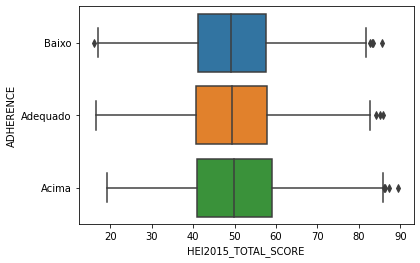

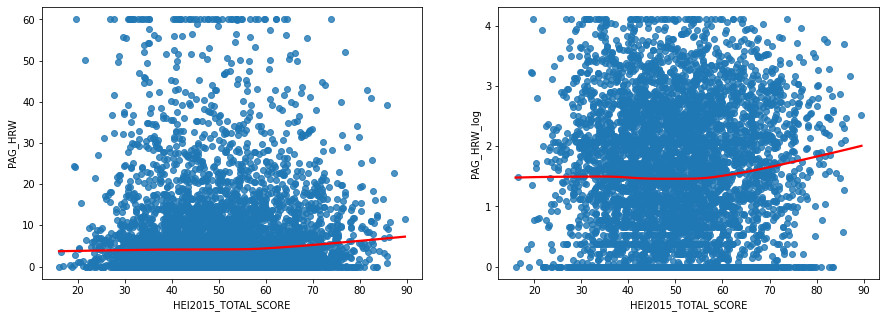

In [ ]:
# fazer uma função com graficos interativos em base desse código.
sns.boxplot(y="ADHERENCE", 
            x="HEI2015_TOTAL_SCORE", 
            orient="h",
            data=njt.replace(label_quali))
plt.show()

fig, ax = plt.subplots(ncols=2, figsize=(15,5))

sns.regplot(x = 'HEI2015_TOTAL_SCORE', 
            y = 'PAG_HRW', 
            lowess=True, 
            line_kws={'color': 'red'},
            data = njt,
            ax = ax[0])

sns.regplot(x = 'HEI2015_TOTAL_SCORE', 
            y = 'PAG_HRW_log', 
            lowess=True, 
            line_kws={'color': 'red'},
            data = njt,
            ax = ax[1])
plt.show()

In [ ]:
db_aux = njt[["ADHERENCE", "HEI2015_TOTAL_SCORE"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.ADHERENCE == 1)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.ADHERENCE == 2)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.ADHERENCE == 3)]["HEI2015_TOTAL_SCORE"])

print('stat=%.3f, p=%.3f' % (stat,p))

stat=4.122, p=0.016


Comparações multiplas:

In [ ]:
tukey = pairwise_tukeyhsd(db_aux['HEI2015_TOTAL_SCORE'],
                  db_aux['ADHERENCE'],
                  alpha = 0.05)

print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   1.0    2.0   0.3937 0.7031  -0.805 1.5924  False
   1.0    3.0   1.0773  0.012  0.1931 1.9616   True
   2.0    3.0   0.6837  0.378 -0.5186 1.8859  False
---------------------------------------------------


In [ ]:
db_aux = njt[["RIAGENDR", "PAG_HRW", "PAG_HRW_log", "HEI2015_TOTAL_SCORE"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.RIAGENDR == 1)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.RIAGENDR == 2)]["HEI2015_TOTAL_SCORE"])

print('stat=%.3f, p=%.3f' % (stat, p))

stat=27.216, p=0.000


In [ ]:
db_aux = njt[["RIAGENDR", "PAG_HRW", "PAG_HRW_log", "HEI2015_TOTAL_SCORE"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.RIAGENDR == 1)]["PAG_HRW_log"],
                   db_aux[(db_aux.RIAGENDR == 2)]["PAG_HRW_log"])

print('stat=%.3f, p=%.3f' % (stat, p))

stat=50.329, p=0.000


In [ ]:
db_aux = njt[["RIDRETH1", "PAG_HRW", "PAG_HRW_log", "HEI2015_TOTAL_SCORE"]].dropna()

stat, p = f_oneway(db_aux[(db_aux.RIDRETH1 == 1)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.RIDRETH1 == 2)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.RIDRETH1 == 3)]["HEI2015_TOTAL_SCORE"],
                   db_aux[(db_aux.RIDRETH1 == 4)]["HEI2015_TOTAL_SCORE"])

print('stat=%.3f, p=%.3f' % (stat, p))

stat=11.860, p=0.000


In [ ]:
tukey = pairwise_tukeyhsd(db_aux['HEI2015_TOTAL_SCORE'],
                  db_aux['RIDRETH1'],
                  alpha = 0.05)

print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   -0.964  0.556 -2.8709   0.943  False
     1      3  -1.0955 0.0718 -2.2542  0.0632  False
     1      4  -2.9767  0.001 -4.2992 -1.6541   True
     2      3  -0.1315    0.9 -1.8988  1.6357  False
     2      4  -2.0127 0.0302 -3.8914  -0.134   True
     3      4  -1.8812  0.001 -2.9928 -0.7696   True
----------------------------------------------------


In [ ]:
stat, p = f_oneway(db_aux[(db_aux.RIDRETH1 == 1)]["PAG_HRW_log"],
                   db_aux[(db_aux.RIDRETH1 == 2)]["PAG_HRW_log"],
                   db_aux[(db_aux.RIDRETH1 == 3)]["PAG_HRW_log"],
                   db_aux[(db_aux.RIDRETH1 == 4)]["PAG_HRW_log"])

print('stat=%.3f, p=%.3f' % (stat, p))

stat=25.845, p=0.000


In [ ]:
tukey = pairwise_tukeyhsd(db_aux['PAG_HRW_log'],
                  db_aux['RIDRETH1'],
                  alpha = 0.05)

print(tukey)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     1      2   0.3757  0.001  0.2016  0.5499   True
     1      3   0.3502  0.001  0.2444   0.456   True
     1      4    0.229  0.001  0.1082  0.3498   True
     2      3  -0.0255    0.9 -0.1869  0.1359  False
     2      4  -0.1467 0.1241 -0.3183  0.0248  False
     3      4  -0.1212 0.0116 -0.2227 -0.0197   True
----------------------------------------------------
